In [1]:
import scanpy as sc, dynamo as dyn, scvelo as scv, pandas as pd, numpy as np

|-----> setting visualization default mode in dynamo. Your customized matplotlib settings might be overritten.


/home/csj/anaconda3/envs/celltensor/lib/python3.8/site-packages/nxviz/__init__.py:18: UserWarning: 
nxviz has a new API! Version 0.7.3 onwards, the old class-based API is being
deprecated in favour of a new API focused on advancing a grammar of network
graphics. If your plotting code depends on the old API, please consider
pinning nxviz at version 0.7.3, as the new API will break your old code.

To check out the new API, please head over to the docs at
https://ericmjl.github.io/nxviz/ to learn more. We hope you enjoy using it!

(This deprecation message will go away in version 1.0.)

  warnings.warn(


In [2]:
adata=sc.read_h5ad('/home/csj/mywork/ilc/220409-preprocessed_data/220516-FL.velo.h5ad')
idata = sc.read_h5ad('./full-alp.final.h5ad')

# only keep cells appeared in FL batch
idata = idata[idata.obs.batch=='FL'].copy()
# modify barcodes to consistent formats
idata.obs_names=[s[0]for s in idata.obs_names.str.split("-")]
# keep analyzed cells
adata = adata[idata.obs_names].copy()
# use existed umap
adata.obsm['X_umap'] = idata[adata.obs_names].obsm['X_umap'].copy()
# tranfer precomputed labels
adata.obs['leiden'] = idata[adata.obs_names].obs['leiden']

palette= {'0':'#E5B1D1',"1":'#B8818F','2':'#CB393C',
    "5":'#2F2B54',"6":'#2C6D9E','9':'#EA993A',
    '3':'#B3BA43','7':'#55C29E','4':"#286251",'8':'#923698'}

In [3]:
palette= {'0':'#E5B1D1',"1":'#B8818F','2':'#CB393C',
    "5":'#2F2B54',"6":'#2C6D9E','9':'#EA993A',
    '3':'#B3BA43','7':'#55C29E','4':"#286251",'8':'#923698'}

In [4]:
# preprocess data 
## - detect experiment type
## - set expression matrix
## - detect if normalized/log1p 
## - setting QC thresholds
## - calculating variable genes
## - calculating size factors and normalize
## - pca
## - cell-cycle scoring
goi = [ "Id2","Ncor1","Nfil3","Zbtb16","Rora","Runx3","Runx2","Runx1",
        "Cbfb","Tox","Was","Zbtb1","Zbtb46","Zeb2",
        "Rorc","Ahr","Maf","Ikzf1","Ikzf3","Nr1d1","Zfp292","Batf3",
        "Bcl11b","Myc","Gata3","Gfi1","Tbx21","Eomes","Irf8","Bhlhe40",
        "Notch1","Notch2","Rbpj","Tcf7","Hes1","Dtx1",
        "Zbtb16",'Ccr6' ]
dyn.pp.recipe_monocle(adata, genes_to_append=goi, genes_to_exclude=['Malat1'])


|-----> recipe_monocle_keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_cells_key=True
|-----> recipe_monocle_keep_filtered_genes_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_genes_key=True
|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['

In [5]:
# estimate 𝛾 and calculate velocities
# the parameter `group` facilitate computing kinetics parameters for different lineages

dyn.tl.moments(adata, n_neighbors=50)
dyn.tl.dynamics(adata, model='stochastic', cores=10)

|-----> calculating first/second moments...
|-----> [moments calculation] in progress: 100.0000%
|-----> [moments calculation] finished [46.5482s]
|-----> dynamics_del_2nd_moments_key is None. Using default value from DynamoAdataConfig: dynamics_del_2nd_moments_key=False


AnnData object with n_obs × n_vars = 4166 × 31053
    obs: 'Clusters', 'ann0608', 'phase', 'leiden', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'score', 'log_cv', 'log_m', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics'
    uns: 'ann0608_colors', 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics'
    obsm: 'X_pca', 'X_umap', 'X', 'cell_cycle_scores'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'X_spliced', 'X_unspliced', 'M_u', 'M_uu', 'M_s'

|-----------> plotting with basis key=X_umap
|-----------> skip filtering phase by stack threshold when stacking color because it is not a numeric type


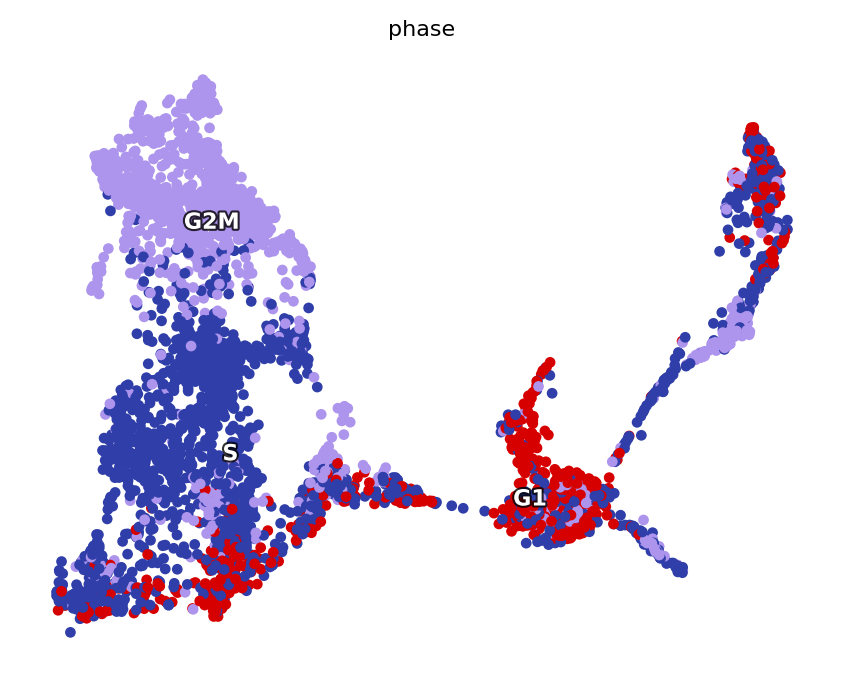

|-----------> plotting with basis key=X_umap
|-----------> skip filtering cell_cycle_phase by stack threshold when stacking color because it is not a numeric type


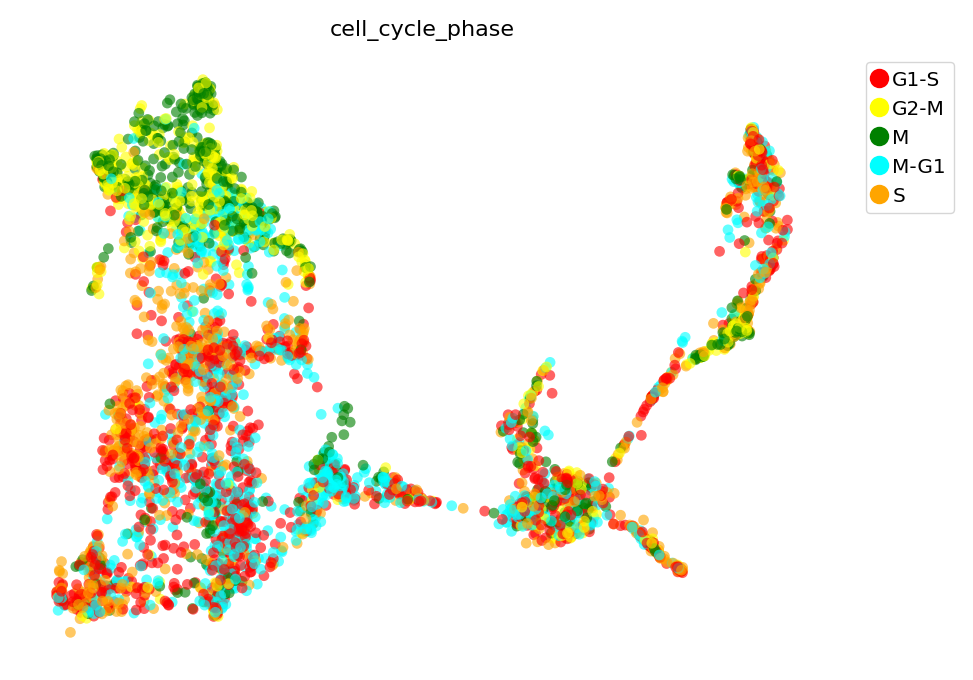

|-----------> plotting with basis key=X_umap
|-----------> skip filtering ann0608 by stack threshold when stacking color because it is not a numeric type


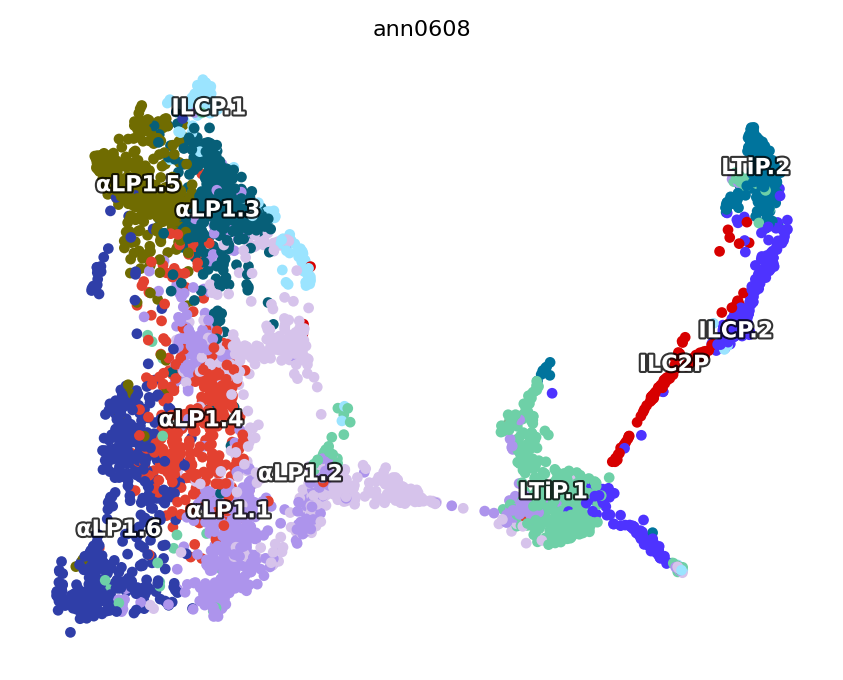

|-----------> plotting with basis key=X_umap
|-----------> skip filtering leiden by stack threshold when stacking color because it is not a numeric type


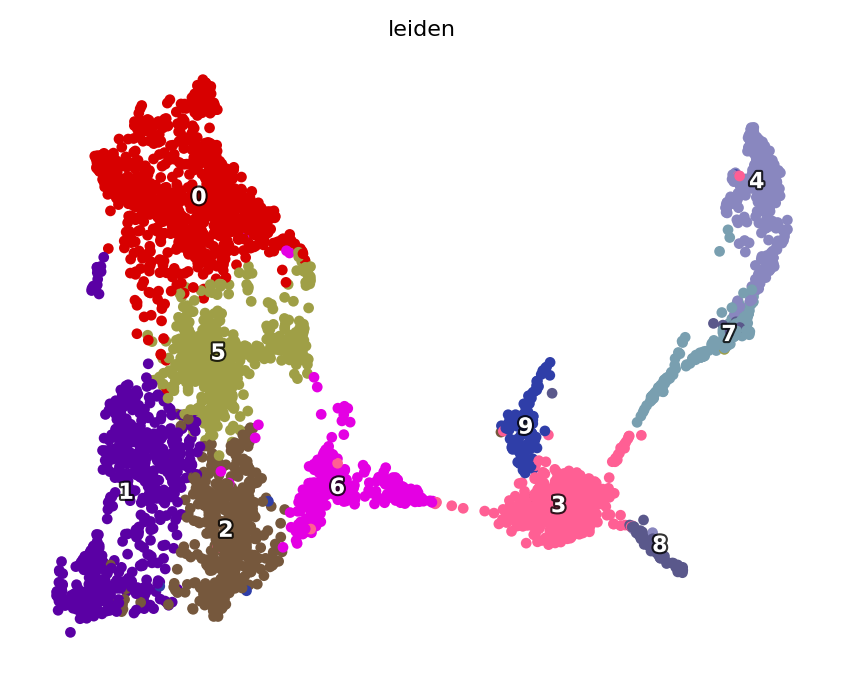

In [6]:
dyn.pl.scatters(adata,basis='umap', color='phase', alpha=1, pointsize=0.06)
dyn.pl.scatters(adata,basis='umap', color='cell_cycle_phase', alpha=0.61, pointsize=0.06, show_legend=True,
               color_key={'G1-S':'red','S':'orange','G2-M':'yellow','M':'green','M-G1':'cyan'})
dyn.pl.scatters(adata,basis='umap', color='ann0608', alpha=1, pointsize=0.06)
dyn.pl.scatters(adata,basis='umap', color='leiden', alpha=1, pointsize=0.06)

|-----------> plotting with basis key=X_pca
|-----------> skip filtering ann0608 by stack threshold when stacking color because it is not a numeric type


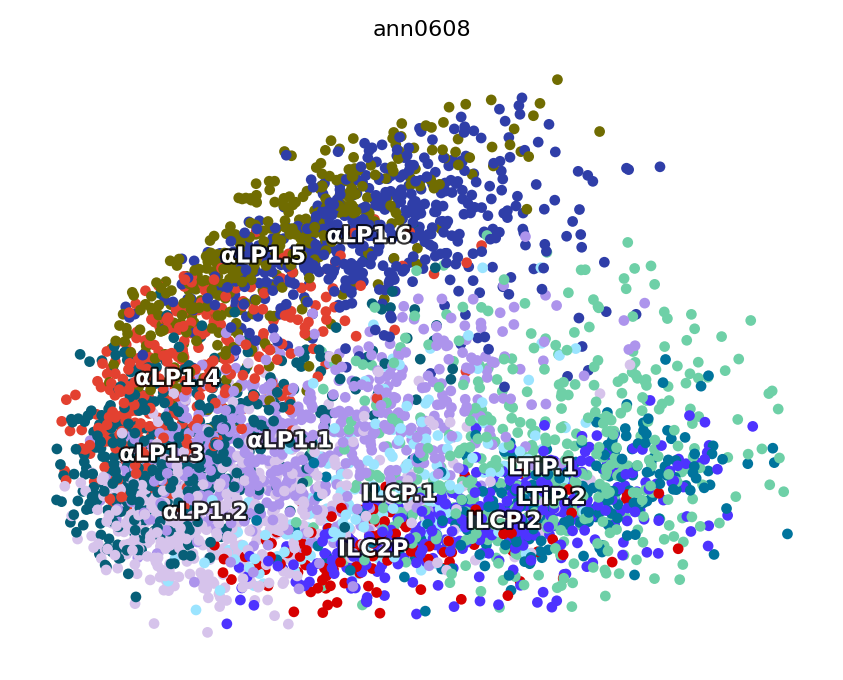

|-----------> plotting with basis key=X_pca
|-----------> skip filtering leiden by stack threshold when stacking color because it is not a numeric type


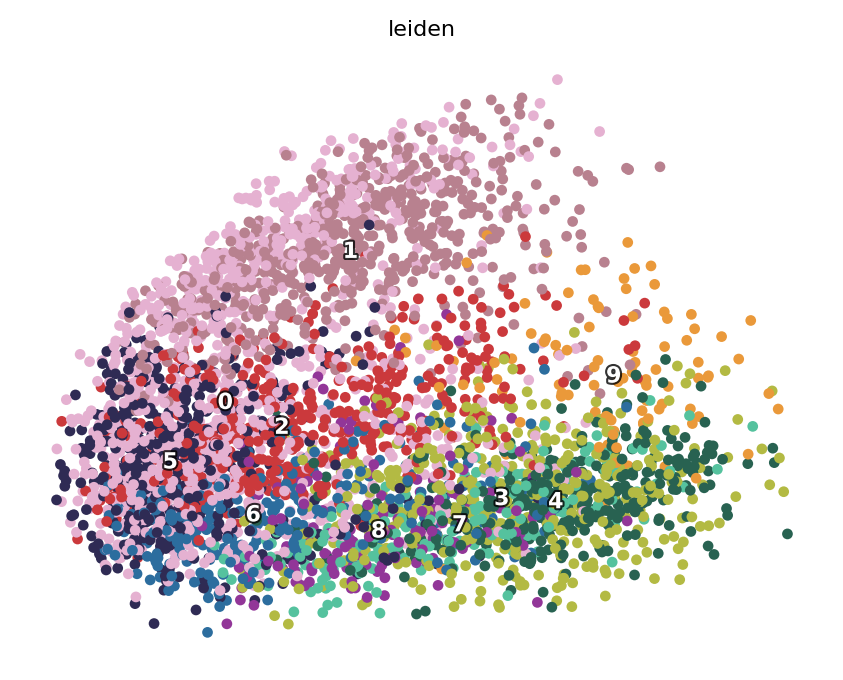

|-----------> plotting with basis key=X_pca
|-----------> skip filtering phase by stack threshold when stacking color because it is not a numeric type


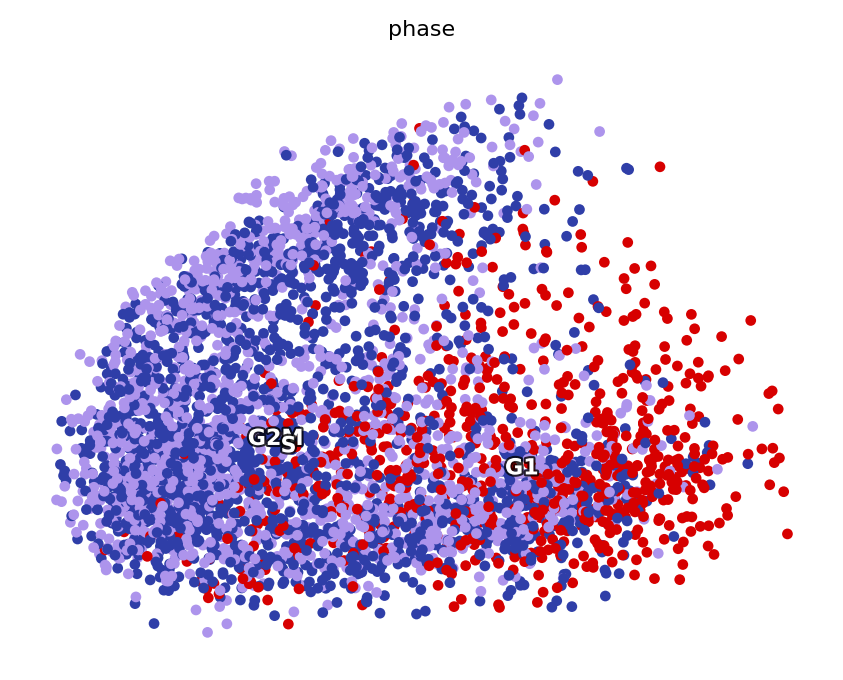

|-----------> plotting with basis key=X_pca
|-----------> skip filtering cell_cycle_phase by stack threshold when stacking color because it is not a numeric type


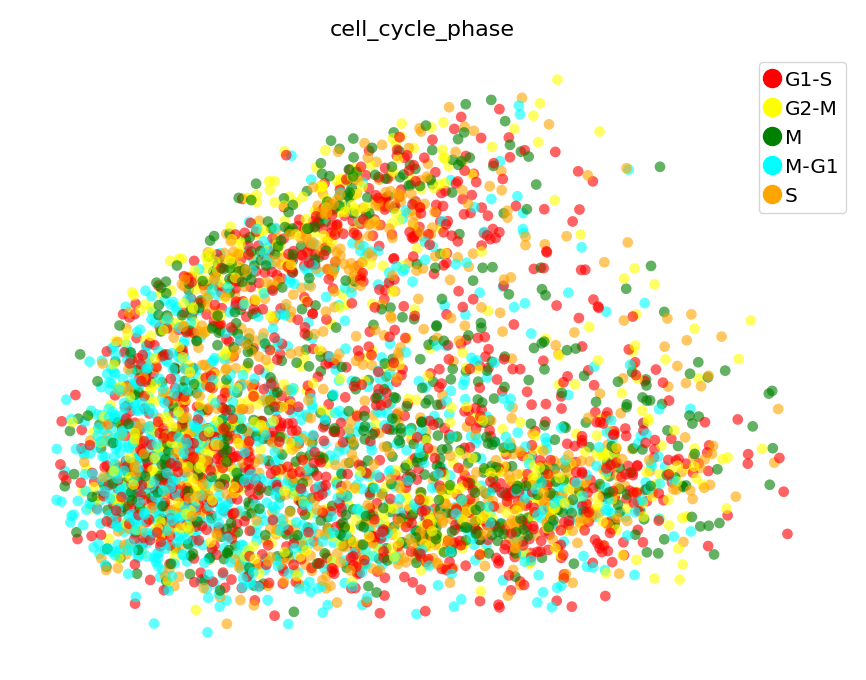

In [7]:
dyn.pl.scatters(adata,basis='pca', color='ann0608', alpha=1, pointsize=0.06)
dyn.pl.scatters(adata,basis='pca', color='leiden', alpha=1, pointsize=0.06, color_key=palette)
dyn.pl.scatters(adata,basis='pca', color='phase', alpha=1, pointsize=0.06)
dyn.pl.scatters(adata,basis='pca', color='cell_cycle_phase', alpha=0.61, pointsize=0.06, show_legend=True,
               color_key={'G1-S':'red','S':'orange','G2-M':'yellow','M':'green','M-G1':'cyan'})


In [9]:
adata_bkup2 = adata.copy()

In [10]:
# Calculate UMAP. if already exists, skip
adata = adata_bkup2.copy()
dyn.tl.reduceDimension(adata)

lin_dict = {'5': ['1','6'],'6':["3"], '3':['9']}

dyn.tl.gene_wise_confidence(adata, group='leiden', lineage_dict=lin_dict)

# project velocity vectors to low-d embeddings
dyn.tl.cell_velocities(adata, basis='pca')

# update adata.var["confident_genes"] and project cell_velocities with confident genes only
dyn.tl.confident_cell_velocities(adata, basis='pca',  group='leiden', lineage_dict=lin_dict)

|-----> retrive data for non-linear dimension reduction...
|-----? adata already have basis umap. dimension reduction umap will be skipped! 
set enforce=True to re-performing dimension reduction.
|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:pca
|-----> method arg is None, choosing methods automatically...
|-----------> method ball_tree selected
|-----> <insert> connectivities to obsp in AnnData Object.
|-----> <insert> distances to obsp in AnnData Object.
|-----> <insert> neighbors to uns in AnnData Object.
|-----> <insert> neighbors.indices to uns in AnnData Object.
|-----> <insert> neighbors.params to uns in AnnData Object.
|-----> [dimension_reduction projection] in progress: 100.0000%
|-----> [dimension_reduction projection] finished [0.9300s]


calculating gene velocity vectors confidence based on phase portrait location with priors of progenitor/mature cell types: 1999it [01:26, 23.23it/s]


|-----> 0 genes are removed because of nan velocity values.
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] finished [9.8001s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [2.2345s]


calculating gene velocity vectors confidence based on phase portrait location with priors of progenitor/mature cell types: 1999it [01:21, 24.54it/s]


|-----> 0 genes are removed because of nan velocity values.
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] finished [4.7482s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [1.8588s]


AnnData object with n_obs × n_vars = 4166 × 31053
    obs: 'Clusters', 'ann0608', 'phase', 'leiden', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'score', 'log_cv', 'log_m', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'avg_prog_confidence', 'avg_mature_confidence', 'use_for_transition', 'avg_confidence', 'confident_genes'
    uns: 'ann0608_colors', 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics', 'phase_colors', 'cell_cycle_phase_colors', 'leiden_co

|-----> retrive data for non-linear dimension reduction...
|-----? adata already have basis umap. dimension reduction umap will be skipped! 
set enforce=True to re-performing dimension reduction.
|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:pca
|-----> method arg is None, choosing methods automatically...
|-----------> method ball_tree selected
|-----> <insert> connectivities to obsp in AnnData Object.
|-----> <insert> distances to obsp in AnnData Object.
|-----> <insert> neighbors to uns in AnnData Object.
|-----> <insert> neighbors.indices to uns in AnnData Object.
|-----> <insert> neighbors.params to uns in AnnData Object.
|-----> [dimension_reduction projection] in progress: 100.0000%
|-----> [dimension_reduction projection] finished [0.7345s]
|-----> 0 genes are removed because of nan velocity values.
Using existing pearson_transition_matrix found in .obsp.
|-----> [projecting velo

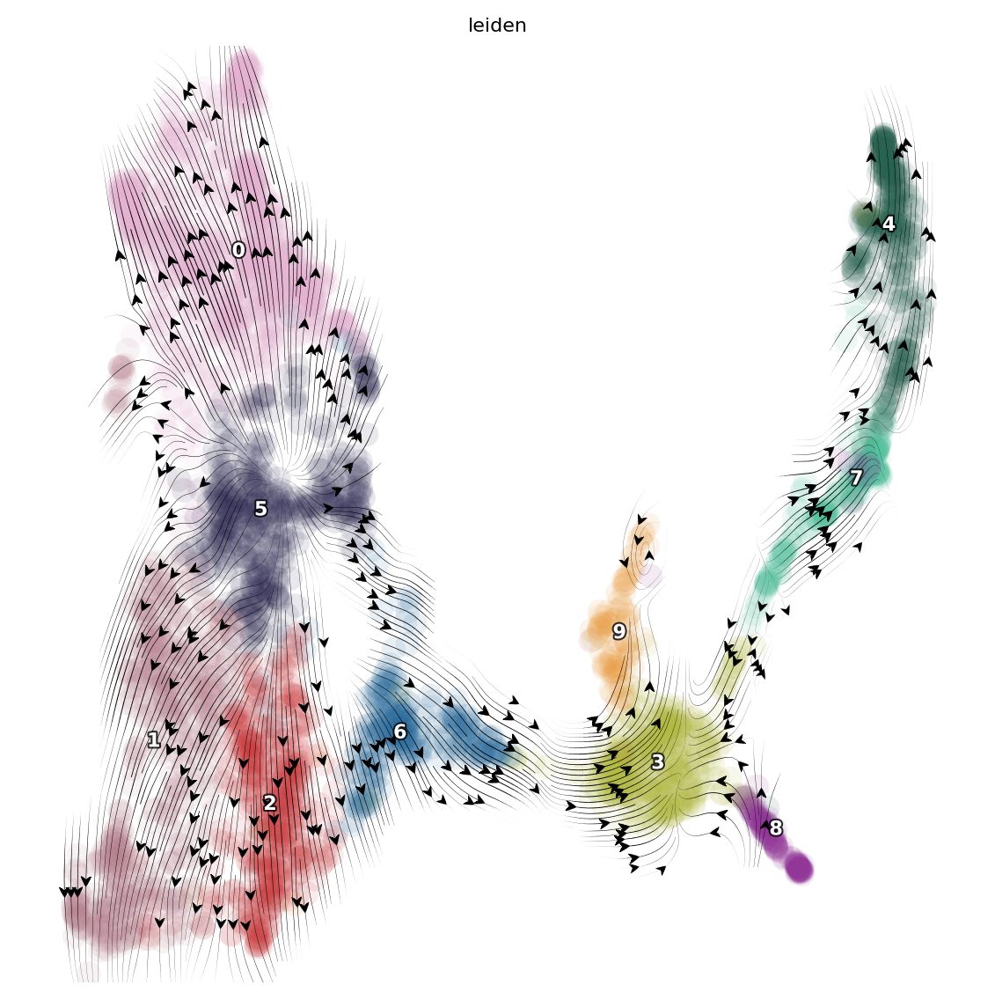

In [11]:
dyn.pl.streamline_plot(adata, color='leiden', #aggregate='leiden',
                       alpha=1, #show_arrowed_spines=True,
                       density=3, linewidth=0.2, streamline_alpha=1, frontier=False,
                       pointsize=0.4, calpha=1,figsize=[7,7],
                       color_key=palette)


|-----------> plotting with basis key=X_pca
|-----------> skip filtering leiden by stack threshold when stacking color because it is not a numeric type


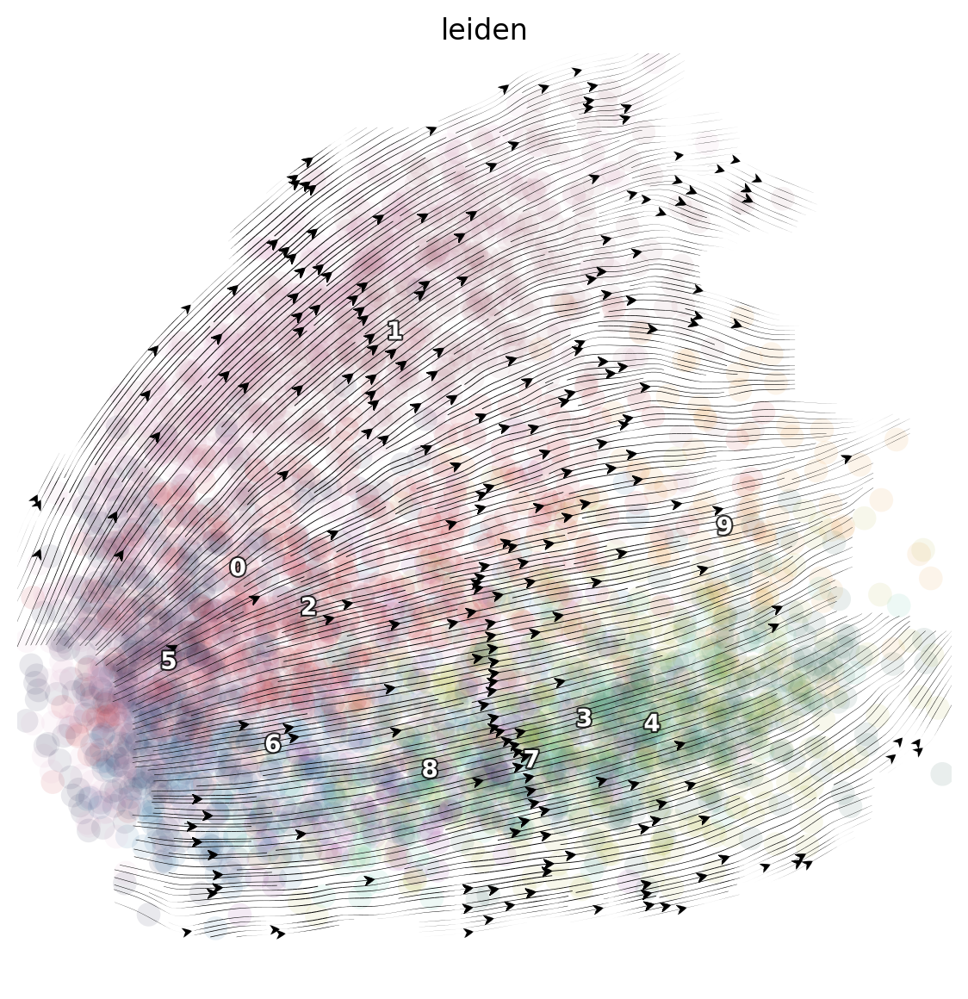

In [12]:
dyn.pl.streamline_plot(adata, color='leiden',basis='pca', #aggregate='leiden',
                       alpha=1, #show_arrowed_spines=True,
                       density=3, linewidth=0.2, streamline_alpha=1, frontier=False,
                       pointsize=0.4, calpha=1,figsize=[7,7],
                       color_key=palette)


In [14]:
dyn.vf.VectorField(adata, basis='pca', M=1000)

dyn.ext.ddhodge(adata, basis='pca', cores=2)


|-----> VectorField reconstruction begins...
|-----> Retrieve X and V based on basis: PCA. 
        Vector field will be learned in the PCA space.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] in progress: 100.0000%
|-----> [SparseVFC] finished [115.1815s]
|-----> <insert> velocity_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_pca_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_pca to uns in AnnData Object.
|-----> <insert> control_point_pca to obs in AnnData Object.
|-----> <insert> inlier_prob_pca to obs in AnnData Object.
|-----> <insert> obs_vf_angle_pca to obs in AnnData Object.
|-----> [VectorField] in progress: 100.0000%
|-----> [VectorField] finished [115.7872s]
|-----> graphizing vectorfield...
|-----------? nbrs_idx argument is ignored and recomputed because nbrs_idx is not None and return_nbrs=True
|-----------> calculating 

In [20]:
adata

AnnData object with n_obs × n_vars = 4166 × 31053
    obs: 'Clusters', 'ann0608', 'phase', 'leiden', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'control_point_pca_0_1', 'inlier_prob_pca_0_1', 'obs_vf_angle_pca_0_1', 'pca_ddhodge_div', 'pca_ddhodge_potential'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'score', 'log_cv', 'log_m', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'avg_prog_confidence', 'avg_mature_confidence', 'use_for_transition', 'avg_confid

|-----------> plotting with basis key=X_umap
|-----------> skip filtering leiden by stack threshold when stacking color because it is not a numeric type


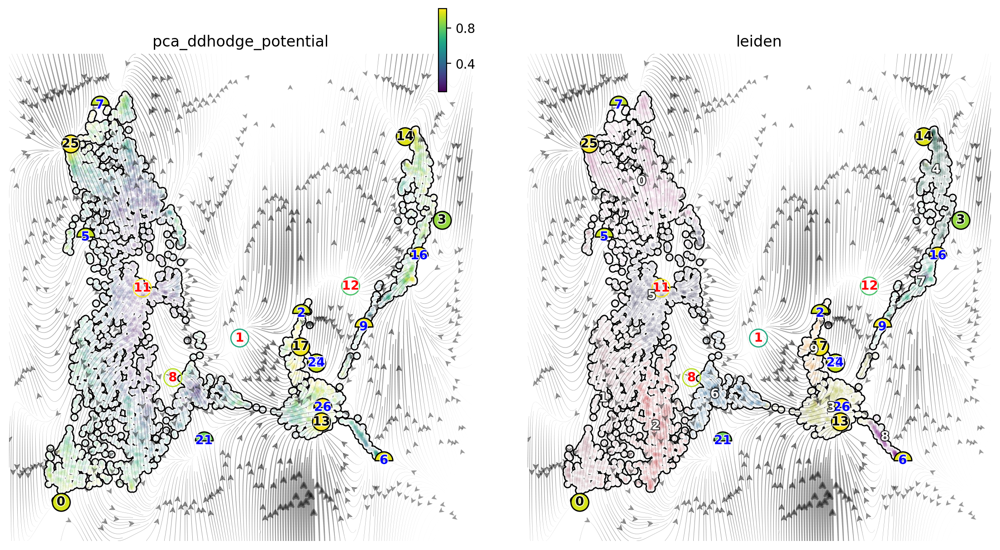

In [27]:
dyn.pl.topography(adata, basis='umap', background='white', color=['pca_ddhodge_potential', 'leiden'], 
                  pointsize=0.04, color_key=palette, alpha=1, figsize=[7,7], density=3,
                  streamline_color='black', show_legend='on data', frontier=True)

In [35]:
dyn.pp.top_pca_genes(adata, n_top_genes=100);
top_pca_genes = adata.var.index[adata.var.top_pca_genes];
# we can add whichever genes of interests as long as they are used for pca 
top_pca_genes = np.unique(["Rorc", "Bcl11b", "Gata3", ] + list(top_pca_genes)).tolist()

|-----------> <insert> top_pca_genes to var in AnnData Object.


In [36]:
dyn.vf.jacobian(adata, regulators=top_pca_genes, effectors=top_pca_genes, sampling=None, cores=20)

AnnData object with n_obs × n_vars = 4166 × 31053
    obs: 'Clusters', 'ann0608', 'phase', 'leiden', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap', 'control_point_pca_0_1', 'inlier_prob_pca_0_1', 'obs_vf_angle_pca_0_1', 'pca_ddhodge_div', 'pca_ddhodge_potential', 'jacobian_det_pca'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'score', 'log_cv', 'log_m', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'avg_prog_confidence', 'avg_mature_confidence', 'use_for_tran

In [38]:
! ls

 220920-ABM-integratedEmbedding-DynamoAnalysis.ipynb
 220920-DEG_merged.csv
 220920-FL_ABM-DEGComparison-deprecated.ipynb
 220920-FL_ABM-DEGComparison.ipynb
 220920-FL_ABM-integration.ipynb
 2210009-conserved.deg.csv
 221006-ABM1and2_umap-celltype.pdf
 221006-ABM_DotPlot.pdf
 221006-FeaturePlots.pdf
 221006-FL_DotPlot.pdf
 221006-FL_umap-celltype.pdf
 221006-ImmGen_refine_mapping-stackedbar.pdf
 221006-leiden-stackedbar.pdf
 221006-Total_DotPlot.pdf
 221006-total_umap-batch.pdf
 221006-total_umap-celltype.pdf
 221006-total_umap.pdf
 221009-ImmGen_refine_mapping_split-stackedbar.pdf
 221009-ImmGen_refine_mapping-stackedbar.pdf
 221010-ABM_DotPlot.pdf
 221010-FL_DotPlot.pdf
 221010-heatmap-conserved_markers.pdf
 221010-heatmap-important_FL_ABM_diffgenes.pdf
 221010-ImmGen_refine_mapping_split-stackedbar.pdf
 221010-ImmGen_refine_mapping-stackedbar.pdf
 221010-leiden-stackedbar.pdf
 221010-Total_DotPlot.pdf
 221011-C3_important_genes_diff.pdf
 221011-C5_important_genes_diff.pdf
 221011-C6

|-----------> plotting with basis key=X_umap
|-----------> plotting with basis key=X_umap
|-----------> plotting with basis key=X_umap
Saving figure to /home/csj/mywork/ilc/220913-FL_ABM-joint_comparison/221107-FL-jacobian1_dyn_savefig.pdf...
Done
Saving figure to /home/csj/mywork/ilc/220913-FL_ABM-joint_comparison/221107-FL-jacobian2_dyn_savefig.pdf...
Done


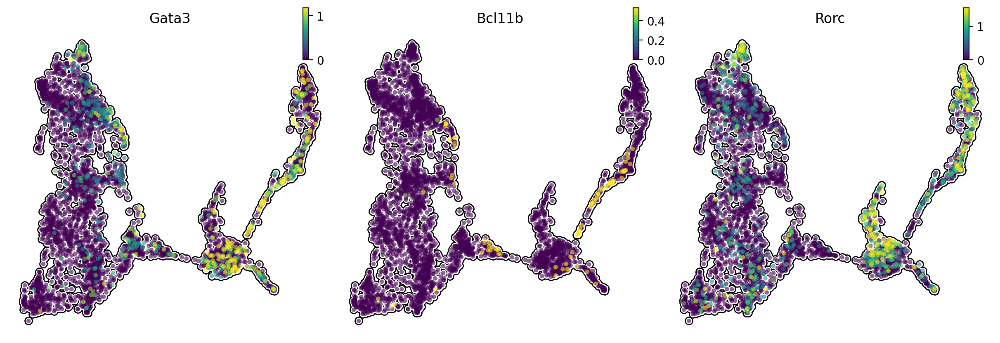

In [39]:
fig, axes = plt.subplots(ncols=3, nrows=1, figsize=(12, 4), constrained_layout=True)
dyn.pl.umap(adata, color='Gata3',figsize=[6,6], pointsize=0.06,alpha=0.6,frontier=True,
                ax= axes[0],save_show_or_return='return'
           )
dyn.pl.umap(adata, color='Bcl11b',figsize=[6,6], pointsize=0.06,alpha=0.6,frontier=True,
                ax= axes[1],save_show_or_return='return'
           )
dyn.pl.umap(adata, color='Rorc',figsize=[6,6], pointsize=0.06,alpha=0.6,frontier=True,
                ax= axes[2],save_show_or_return='return'
           )
fig.savefig('/home/csj/mywork/ilc/220913-FL_ABM-joint_comparison/221107-FL-jacobian3.pdf')

dyn.pl.jacobian(adata, regulators='Gata3', effectors='Rorc', basis='umap', 
                figsize=[6,6], pointsize=0.8,alpha=0.5,
                save_show_or_return='save',
                save_kwargs={'path':'/home/csj/mywork/ilc/220913-FL_ABM-joint_comparison/',
                             'prefix':'221107-FL-jacobian1', 'ext':'pdf'
                            }
               )

dyn.pl.jacobian(adata, regulators='Bcl11b',effectors='Rorc', basis='umap',
                  figsize=[6,6], pointsize=0.8,alpha=0.5,
                  save_show_or_return='save',
                  save_kwargs={'path':'/home/csj/mywork/ilc/220913-FL_ABM-joint_comparison/',
                             'prefix':'221107-FL-jacobian2', 'ext':'pdf'
                            }
               )

In [41]:
dyn.pl.jacobian(adata, regulators='Rorc',effectors='Rorc', basis='umap',
                  figsize=[6,6], pointsize=0.8,alpha=0.5,
                  save_show_or_return='save',
                  save_kwargs={'path':'/home/csj/mywork/ilc/220913-FL_ABM-joint_comparison/',
                             'prefix':'221107-FL-jacobian3', 'ext':'pdf'
                            }
               )

Saving figure to /home/csj/mywork/ilc/220913-FL_ABM-joint_comparison/221107-FL-jacobian3_dyn_savefig.pdf...
Done


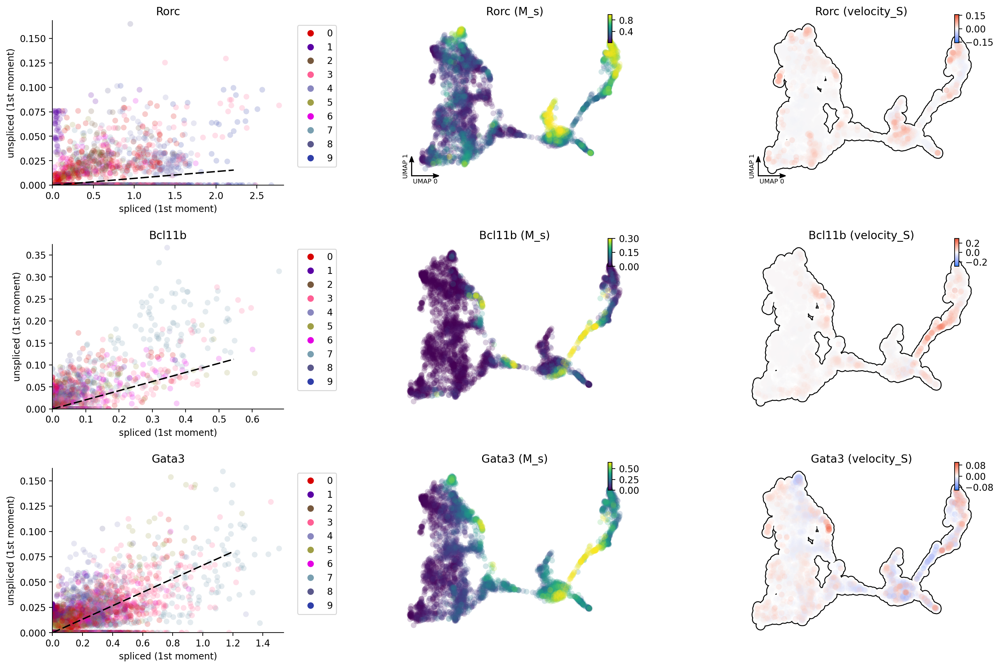

In [40]:
dyn.pl.phase_portraits(adata, genes=['Gata3','Bcl11b','Rorc'], figsize=(6, 4), color='leiden')



# rank div

In [48]:
#Instead the divergence in this context points to the self-activation or self-inhibition terms.
divergence_rank = dyn.vf.rank_divergence_genes(adata, groups='leiden');

In [49]:
divergence_rank.head(50)

,0,1,2,3,4,5,6,7,8,9
0,Id2,Id2,Nkg7,Trbc1,Tyrobp,Pclaf,Id2,Pclaf,Pclaf,Bcl11b
1,Nkg7,Ccnb1,Id2,Ifitm1,Nkg7,Id2,Hmgb2,Hmgb2,Hmgb2,Nde1
2,Trbc2,Arl6ip1,Tyrobp,Rorc,Nusap1,Rrm2,Trbc1,Birc5,Rrm2,Mis18bp1
3,H2afy,Rrm2,Tsc22d1,Cd3g,Birc5,Ccnb1,Nkg7,Nusap1,Birc5,Anapc16
4,Nrgn,Pclaf,Hmgb2,Nusap1,Hmgb2,Ccnb2,Tyrobp,H2-D1,Nusap1,Akirin2
5,Plac8,Cd7,Fcer1g,Ifitm2,Ccnb1,Trbc2,Plac8,Cdca8,Ccnb2,Prc1
6,Tsc22d1,Nusap1,Nrgn,Ccnb1,Cdk1,Hmgb2,Ccnb2,Cdk1,Ccnb1,Prrc2c
7,Fcer1g,Ighm,Ccnb1,Ccl5,Arl6ip1,Nusap1,Ccnb1,Ifitm1,Ifitm1,Shcbp1
8,Spi1,Birc5,Irf8,Arl6ip1,Ifitm1,Crip1,Nusap1,B2m,Cdca8,Cdc26
9,Nusap1,Cox6a2,Cst3,Zfp36l1,Cdca8,Arl6ip1,Pclaf,Nkg7,Arl6ip1,Arl2bp


# rank regulators and effectors

In [42]:
full_reg_rank = dyn.vf.rank_jacobian_genes(adata,
                                           groups='leiden',
                                           mode="full_reg",
                                           abs=False,
                                           output_values=True,
                                           return_df=True)

full_eff_rank = dyn.vf.rank_jacobian_genes(adata,
                                           groups='leiden',
                                           mode="full_eff",
                                           abs=False,
                                           output_values=True,
                                           return_df=True)

In [59]:
trust=pd.read_csv('https://www.grnpedia.org/trrust/data/trrust_rawdata.mouse.tsv',sep='\t', header=None)
trust.columns=['tf','target','mode','ref']
trust

,tf,target,mode,ref
0,Aatf,Bak1,Unknown,22983126
1,Aatf,Bax,Unknown,22983126
2,Aatf,Bbc3,Unknown,22983126
3,Aatf,Cdkn1a,Unknown,21317046
4,Aatf,Tpt1,Activation,17157788
...,...,...,...,...
7052,Zic2,Slc6a4,Unknown,20676059
7053,Zic3,Nanog,Activation,20872845;23421367
7054,Zscan10,Nanog,Activation,17628018
7055,Zscan10,Pou5f1,Activation,17628018


In [75]:
tf_list= trust['tf'].unique().tolist()+\
         pd.read_csv("https://ghproxy.com/https://github.com/chansigit/SSAT/raw/master/mm.tf.csv",sep='\t')['x'].tolist()
tf_list= np.unique(tf_list).tolist()


In [80]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

tf_list = intersection(adata.var_names, tf_list)


In [85]:
tfdf = adata.var.loc[tf_list]
tfdf = tfdf[tfdf['nCells']>10]
tfdf = tfdf[tfdf['nCounts']>10]
tf_list  = tfdf.index.tolist()

print(len(tf_list))

972


In [88]:
def getTopRegulators(Effector = "Rorc",clusterOfInterest = '3'):
    RorcRegulators = full_reg_rank[clusterOfInterest][[Effector, Effector+'_values']]
    RorcRegulators.columns = ['Regulators', 'Jacobian']
    RorcRegulators = RorcRegulators[RorcRegulators['Regulators'].isin(tf_list)]
    return RorcRegulators

FL_Rorc_regu = pd.concat(
    [
    getTopRegulators("Rorc", '5').reset_index().iloc[:, 1:],
    getTopRegulators("Rorc", '6').reset_index().iloc[:, 1:],
    getTopRegulators("Rorc", '3').reset_index().iloc[:, 1:],
    getTopRegulators("Rorc", '7').reset_index().iloc[:, 1:],
    getTopRegulators("Rorc", '9').reset_index().iloc[:, 1:]
    ],
    axis=1
)
FL_Rorc_regu.columns=[
    "Regulators_C5","Jacobian_C5","Regulators_C6","Jacobian_C6",
    "Regulators_C3","Jacobian_C3","Regulators_C7","Jacobian_C7",
    "Regulators_C9","Jacobian_C9"]
FL_Rorc_regu.to_excel('221125-Dynamoprediction-FL-Regulator-of-Rorc.xlsx')